In [1]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="7"  # last GPU. Anyway, only use one GPU.

In [2]:
from datetime import datetime
import os

import numpy as np
import torch
from IPython.display import display
import nvdiffrast.torch as dr
from PIL import Image

In [3]:
h, w = 256, 256
n_triangles = 50
base_lr = 0.03
report_iterations = 10
n_iterations = 2000

In [4]:
glctx = dr.RasterizeGLContext()

In [5]:
verts = (torch.rand(n_triangles, 3, 2) * 2 - 1).cuda()
verts.requires_grad = True
color = torch.rand(n_triangles, 4).float().cuda()
color.requires_grad = True

In [6]:
def normalize(t, low=0.0, high=1.0):
    # result = ( t - t.min() ) / ( t.max() - t.min() )
    # result = torch.nn.functional.hardsigmoid(t)
    result = torch.nn.functional.sigmoid(t)
    result = result * (high - low) + low
    return result

In [7]:
def normalize_verts(verts):
    low, high = -1.0, 1.0
    ts = [
        normalize(verts[..., ch] * 1.5, low, high)
        for ch in range(2)
    ]
    return torch.stack(ts, dim=-1)

In [8]:
def normalize_color(color):
    low, high = 0.0, 1.0
    ts = [
        normalize(color[..., ch] * 1.5, low, high)
        for ch in range(4)
    ]
    return torch.stack(ts, dim=-1)

In [9]:
faces = torch.arange(n_triangles * 3).reshape(-1, 3).int().cuda()
def combine_layers(out, bg_noise=0.05):
    canvas = torch.ones_like(out[0:1,:,:,0:3])
    canvas = canvas + torch.randn_like(out[0:1,:,:,0:3]) * bg_noise
    for i in range(0, n_triangles):
        alpha = out[i:i+1, ..., 3:4]
        #if i > 150:
        alpha = alpha * 0.1
        draw_color = out[i:i+1, ..., 0:3]
        canvas = canvas * (1 - alpha) + alpha * draw_color
    return canvas

In [10]:
def render(v, c, combine_layers_kwargs={}):
    #verts_norm = v 
    #color_norm = c 
    verts_norm = normalize_verts(v)
    color_norm = normalize_color(c) 
    m_ones = -torch.ones(n_triangles, 3, 1).cuda().float()
    ones = torch.ones(n_triangles, 3, 1).cuda().float()
    verts_in = torch.cat([verts_norm, m_ones, ones], dim =2) # [..., None, :]
    colors = color_norm[:, None, :].repeat(1, 3, 1)
    rast, _ = dr.rasterize(glctx, verts_in, faces, resolution=[h, w], grad_db=True)
    out_inter, _ = dr.interpolate(colors, rast, faces)
    out_layers = dr.antialias(out_inter, rast, verts_in, faces, pos_gradient_boost=1)
    out = combine_layers(out_layers, **combine_layers_kwargs)
    return out

In [11]:
class OptimRateScheduler(object):
    def __init__(self, total_iterations):
        self.total_iterations = total_iterations
        self.ramp_up_to = 1 / 20
        self.ramp_down_from = 3 / 4
    def get_lr_scale(self, c_iter):
        t = c_iter / self.total_iterations
        lr_ramp = min(1.0, (1.0 - t) / 0.25)
        lr_ramp = 0.5 - 0.5 * np.cos(lr_ramp * np.pi)
        lr_ramp = lr_ramp * min(1.0, t / 0.05)
        return lr_ramp
    def get_noise_scale(self, c_iter):
        t = c_iter / self.total_iterations
        if t > self.ramp_down_from:
            return 0
        else:
            return ((self.ramp_down_from - t) / self.ramp_down_from)**2

In [12]:
optim = torch.optim.Adam([verts, color], lr = base_lr)
ors = OptimRateScheduler(total_iterations=n_iterations)

In [13]:
def save_as_gif(fn, imgs, fps=12):
    img, *imgs = imgs
    with open(fn, 'wb') as fp_out:
        img.save(fp=fp_out, format='GIF', append_images=imgs,
             save_all=True, duration=int(1000./fps), loop=0)
        
def save_as_frames(fn, imgs, overwrite=True):
    # save to folder `fn` with sequenced filenames
    os.makedirs(fn, exist_ok=True)
    for i, img in enumerate(imgs):
        this_fn = os.path.join(fn, f'{i:08}.png')
        if overwrite or not os.path.exists(this_fn):
            save_as_png(this_fn, img)

def save_as_png(fn, img):
    if not fn.endswith('.png'):
        fn = f'{fn}.png'
    img.save(fn)
            
def save_info_list(fn, info_list):
    with open(fn, 'w') as fout:
        list(map(lambda r: print(r, file=fout), info_list))

In [14]:
import torchvision
import torchvision.transforms as transforms

trans = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.7, 0.9)),
    transforms.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711))
])

In [15]:
prompt = 'Walt Disney World'
# prompt = 'A picture of Tokyo'
# prompt = 'The corporate headquarters complex of Google located at 1600 Amphitheatre Parkway in Mountain View, California.'
#prompt = 'Self'

In [16]:
save_dir = f'diff_clip_nvdiffrast_out/[{prompt}]'
os.makedirs(save_dir, exist_ok=True)

In [17]:
# forward test

In [18]:
import clip

In [19]:
device = 'cuda'
model, preprocess = clip.load("ViT-B/32", device=device)

In [20]:
with torch.no_grad():
    text_features = model.encode_text(clip.tokenize(prompt).to(device))

In [21]:
def to_pil_img(img):
    return Image.fromarray((img[0].clip(0,1).detach().cpu().numpy()*255).astype('uint8'))

def show(img):
    display(to_pil_img(img))

/opt/conda/lib/python3.8/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[2021-08-31 13:32:33.367214]   Iteration 10, lr 0.0026999999999999993, loss -0.1898193359375 loss (without noise) -0.1800537109375


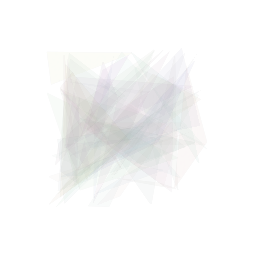

[2021-08-31 13:32:34.280801]   Iteration 20, lr 0.005699999999999999, loss -0.1942138671875 loss (without noise) -0.1824951171875


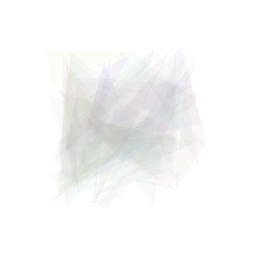

[2021-08-31 13:32:35.195270]   Iteration 30, lr 0.0087, loss -0.194091796875 loss (without noise) -0.1905517578125


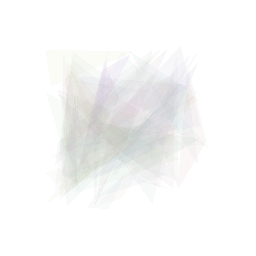

[2021-08-31 13:32:36.120375]   Iteration 40, lr 0.011699999999999999, loss -0.196533203125 loss (without noise) -0.1859130859375


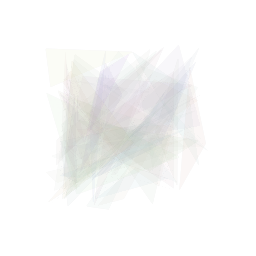

[2021-08-31 13:32:37.057587]   Iteration 50, lr 0.0147, loss -0.1995849609375 loss (without noise) -0.1966552734375


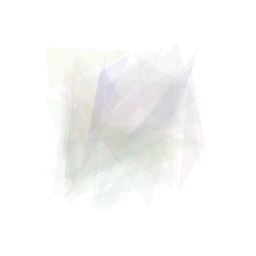

[2021-08-31 13:32:38.000171]   Iteration 60, lr 0.017699999999999997, loss -0.2015380859375 loss (without noise) -0.193359375


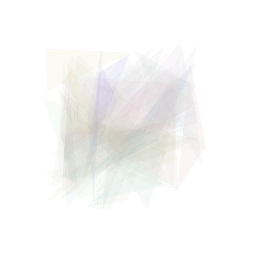

[2021-08-31 13:32:38.961149]   Iteration 70, lr 0.0207, loss -0.2108154296875 loss (without noise) -0.190673828125


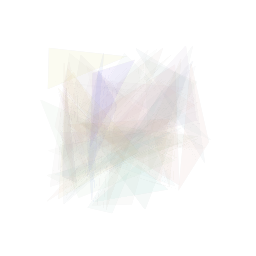

[2021-08-31 13:32:39.942322]   Iteration 80, lr 0.023699999999999995, loss -0.2054443359375 loss (without noise) -0.1905517578125


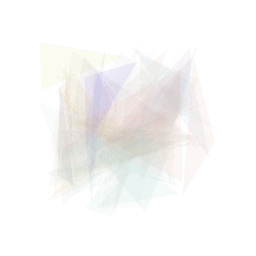

[2021-08-31 13:32:40.940633]   Iteration 90, lr 0.026699999999999995, loss -0.205322265625 loss (without noise) -0.1912841796875


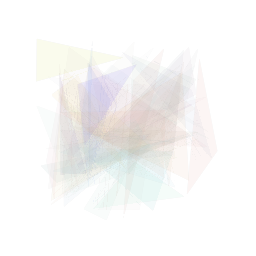

[2021-08-31 13:32:41.981950]   Iteration 100, lr 0.029699999999999997, loss -0.20263671875 loss (without noise) -0.1888427734375


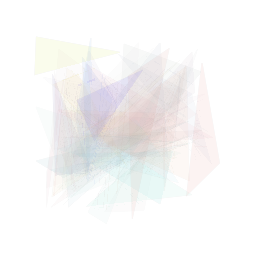

[2021-08-31 13:32:43.025343]   Iteration 110, lr 0.03, loss -0.22021484375 loss (without noise) -0.1900634765625


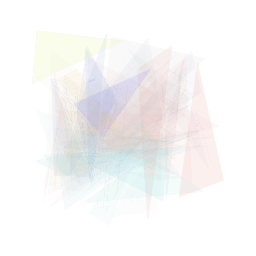

[2021-08-31 13:32:44.080813]   Iteration 120, lr 0.03, loss -0.222412109375 loss (without noise) -0.2044677734375


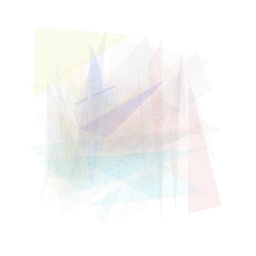

[2021-08-31 13:32:45.155921]   Iteration 130, lr 0.03, loss -0.2408447265625 loss (without noise) -0.1961669921875


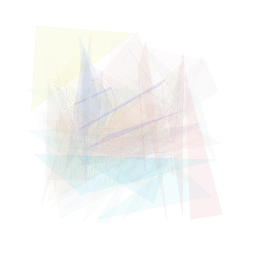

[2021-08-31 13:32:46.247408]   Iteration 140, lr 0.03, loss -0.2247314453125 loss (without noise) -0.1942138671875


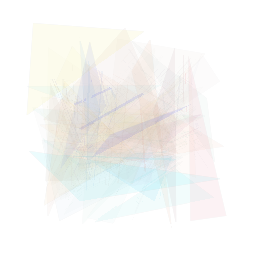

[2021-08-31 13:32:47.365121]   Iteration 150, lr 0.03, loss -0.221435546875 loss (without noise) -0.1903076171875


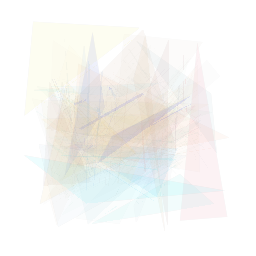

[2021-08-31 13:32:48.487836]   Iteration 160, lr 0.03, loss -0.22802734375 loss (without noise) -0.2017822265625


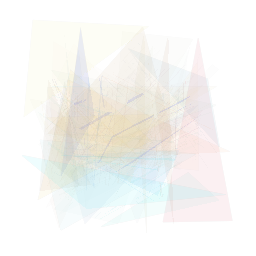

[2021-08-31 13:32:49.677908]   Iteration 170, lr 0.03, loss -0.23681640625 loss (without noise) -0.2059326171875


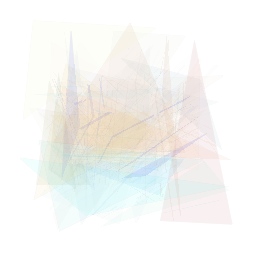

[2021-08-31 13:32:50.855141]   Iteration 180, lr 0.03, loss -0.232666015625 loss (without noise) -0.205322265625


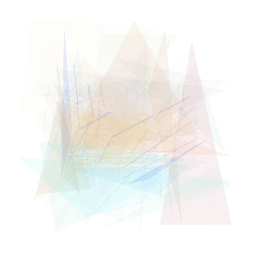

[2021-08-31 13:32:52.054349]   Iteration 190, lr 0.03, loss -0.2255859375 loss (without noise) -0.202392578125


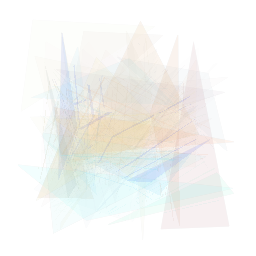

[2021-08-31 13:32:53.248605]   Iteration 200, lr 0.03, loss -0.2283935546875 loss (without noise) -0.195068359375


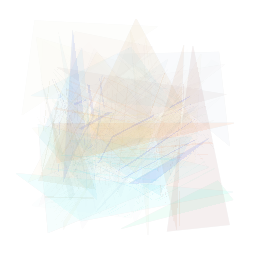

[2021-08-31 13:32:54.480938]   Iteration 210, lr 0.03, loss -0.234619140625 loss (without noise) -0.2025146484375


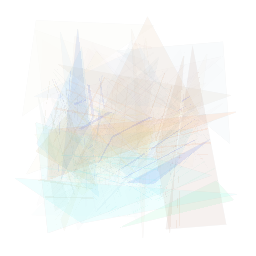

[2021-08-31 13:32:55.730270]   Iteration 220, lr 0.03, loss -0.2322998046875 loss (without noise) -0.1854248046875


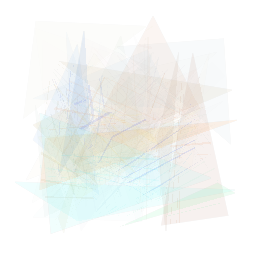

[2021-08-31 13:32:56.989967]   Iteration 230, lr 0.03, loss -0.25732421875 loss (without noise) -0.201904296875


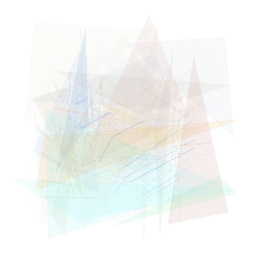

[2021-08-31 13:32:58.292812]   Iteration 240, lr 0.03, loss -0.2369384765625 loss (without noise) -0.1903076171875


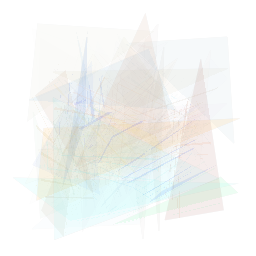

[2021-08-31 13:32:59.600563]   Iteration 250, lr 0.03, loss -0.248291015625 loss (without noise) -0.204345703125


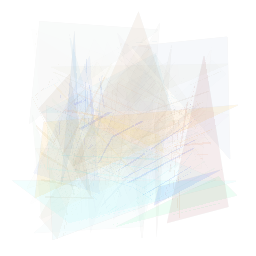

[2021-08-31 13:33:00.950357]   Iteration 260, lr 0.03, loss -0.220703125 loss (without noise) -0.197998046875


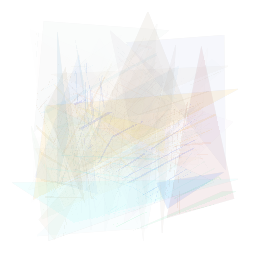

[2021-08-31 13:33:02.310767]   Iteration 270, lr 0.03, loss -0.2320556640625 loss (without noise) -0.2015380859375


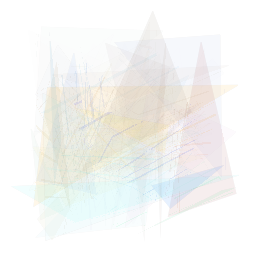

[2021-08-31 13:33:03.681617]   Iteration 280, lr 0.03, loss -0.2318115234375 loss (without noise) -0.1942138671875


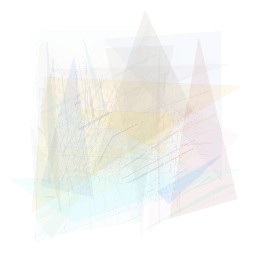

[2021-08-31 13:33:05.087669]   Iteration 290, lr 0.03, loss -0.2308349609375 loss (without noise) -0.196533203125


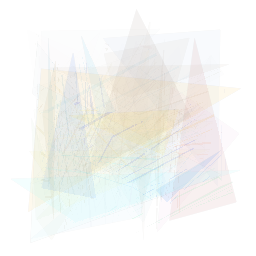

[2021-08-31 13:33:06.514057]   Iteration 300, lr 0.03, loss -0.2607421875 loss (without noise) -0.196533203125


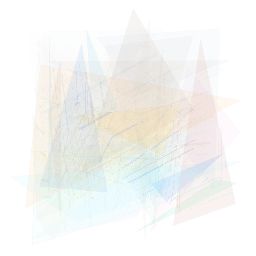

[2021-08-31 13:33:07.943535]   Iteration 310, lr 0.03, loss -0.2626953125 loss (without noise) -0.207275390625


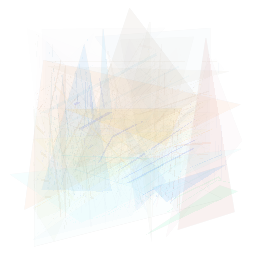

[2021-08-31 13:33:09.422130]   Iteration 320, lr 0.03, loss -0.241943359375 loss (without noise) -0.1953125


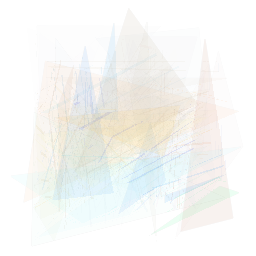

[2021-08-31 13:33:10.903190]   Iteration 330, lr 0.03, loss -0.208740234375 loss (without noise) -0.2020263671875


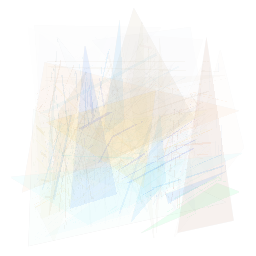

[2021-08-31 13:33:12.393203]   Iteration 340, lr 0.03, loss -0.24365234375 loss (without noise) -0.203125


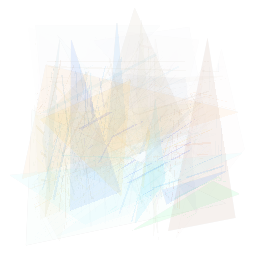

[2021-08-31 13:33:13.916637]   Iteration 350, lr 0.03, loss -0.25537109375 loss (without noise) -0.2135009765625


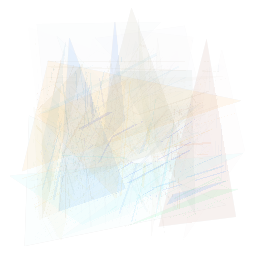

[2021-08-31 13:33:15.475639]   Iteration 360, lr 0.03, loss -0.240234375 loss (without noise) -0.2042236328125


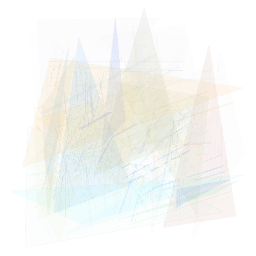

[2021-08-31 13:33:17.030084]   Iteration 370, lr 0.03, loss -0.266845703125 loss (without noise) -0.1849365234375


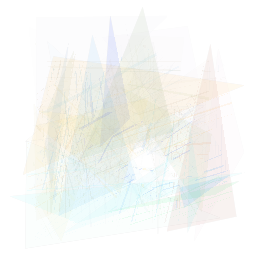

[2021-08-31 13:33:18.596332]   Iteration 380, lr 0.03, loss -0.23583984375 loss (without noise) -0.1865234375


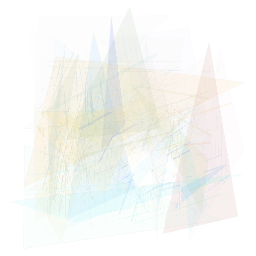

[2021-08-31 13:33:20.230630]   Iteration 390, lr 0.03, loss -0.2337646484375 loss (without noise) -0.19384765625


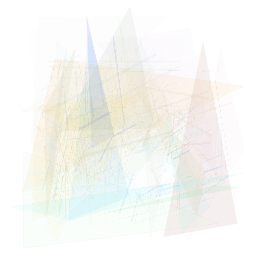

[2021-08-31 13:33:21.841249]   Iteration 400, lr 0.03, loss -0.240966796875 loss (without noise) -0.226318359375


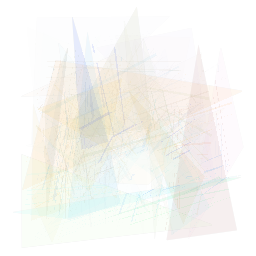

[2021-08-31 13:33:23.502021]   Iteration 410, lr 0.03, loss -0.253173828125 loss (without noise) -0.1968994140625


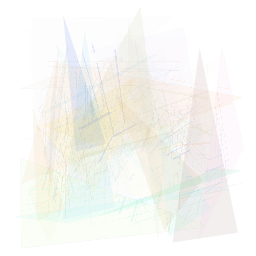

[2021-08-31 13:33:25.177968]   Iteration 420, lr 0.03, loss -0.223388671875 loss (without noise) -0.186767578125


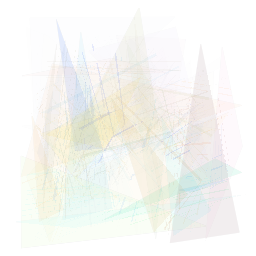

[2021-08-31 13:33:26.840409]   Iteration 430, lr 0.03, loss -0.23046875 loss (without noise) -0.202392578125


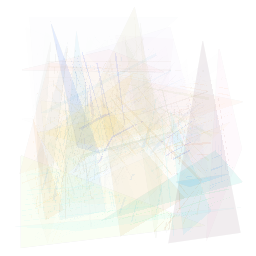

[2021-08-31 13:33:28.562373]   Iteration 440, lr 0.03, loss -0.24609375 loss (without noise) -0.1905517578125


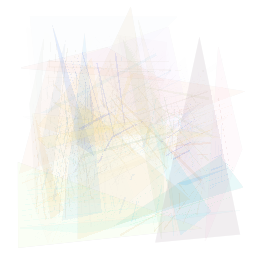

[2021-08-31 13:33:30.286439]   Iteration 450, lr 0.03, loss -0.2274169921875 loss (without noise) -0.2098388671875


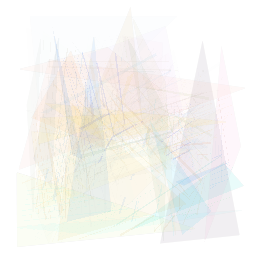

[2021-08-31 13:33:32.018264]   Iteration 460, lr 0.03, loss -0.268798828125 loss (without noise) -0.20556640625


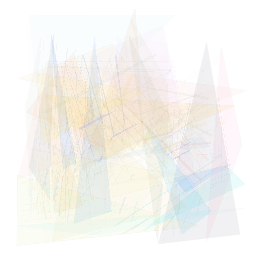

[2021-08-31 13:33:33.768452]   Iteration 470, lr 0.03, loss -0.25146484375 loss (without noise) -0.2109375


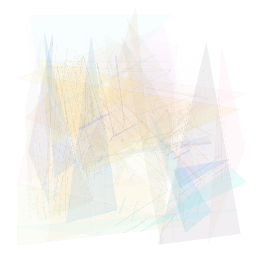

[2021-08-31 13:33:35.525114]   Iteration 480, lr 0.03, loss -0.2568359375 loss (without noise) -0.19921875


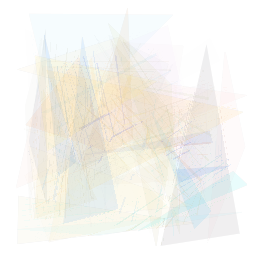

[2021-08-31 13:33:37.298427]   Iteration 490, lr 0.03, loss -0.24755859375 loss (without noise) -0.193115234375


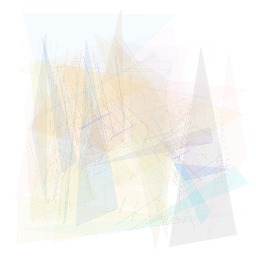

[2021-08-31 13:33:39.108729]   Iteration 500, lr 0.03, loss -0.236083984375 loss (without noise) -0.2059326171875


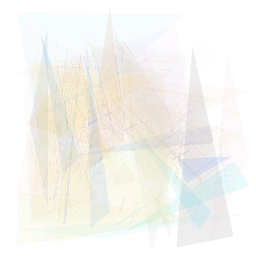

[2021-08-31 13:33:40.945214]   Iteration 510, lr 0.03, loss -0.2420654296875 loss (without noise) -0.18603515625


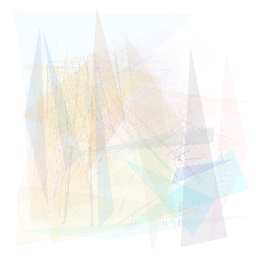

[2021-08-31 13:33:42.818676]   Iteration 520, lr 0.03, loss -0.2410888671875 loss (without noise) -0.1873779296875


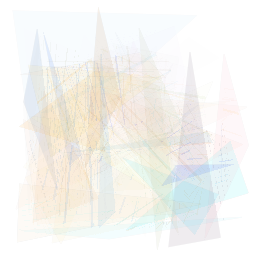

[2021-08-31 13:33:44.715632]   Iteration 530, lr 0.03, loss -0.228271484375 loss (without noise) -0.2039794921875


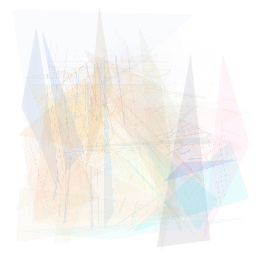

[2021-08-31 13:33:46.631484]   Iteration 540, lr 0.03, loss -0.2705078125 loss (without noise) -0.2135009765625


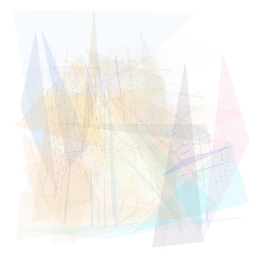

[2021-08-31 13:33:48.525463]   Iteration 550, lr 0.03, loss -0.2401123046875 loss (without noise) -0.192138671875


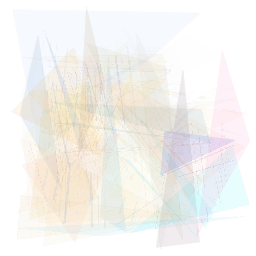

[2021-08-31 13:33:50.468188]   Iteration 560, lr 0.03, loss -0.2744140625 loss (without noise) -0.228515625


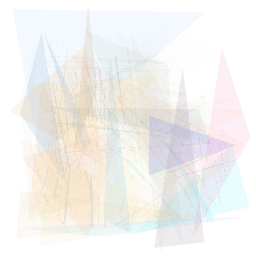

[2021-08-31 13:33:52.436500]   Iteration 570, lr 0.03, loss -0.2216796875 loss (without noise) -0.2037353515625


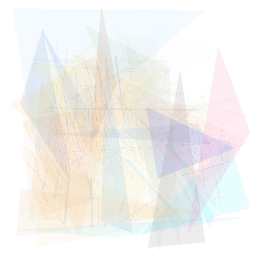

[2021-08-31 13:33:54.417429]   Iteration 580, lr 0.03, loss -0.2440185546875 loss (without noise) -0.18115234375


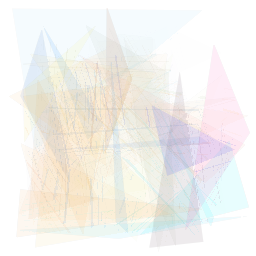

[2021-08-31 13:33:56.473397]   Iteration 590, lr 0.03, loss -0.2301025390625 loss (without noise) -0.2005615234375


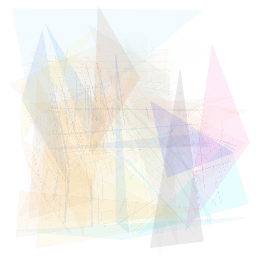

[2021-08-31 13:33:58.585267]   Iteration 600, lr 0.03, loss -0.2230224609375 loss (without noise) -0.2093505859375


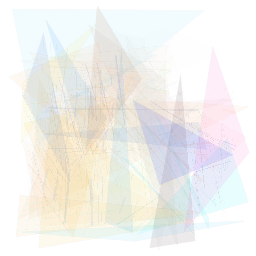

[2021-08-31 13:34:00.712081]   Iteration 610, lr 0.03, loss -0.2215576171875 loss (without noise) -0.2060546875


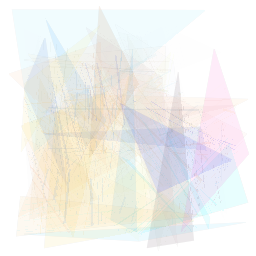

[2021-08-31 13:34:02.886504]   Iteration 620, lr 0.03, loss -0.2408447265625 loss (without noise) -0.2078857421875


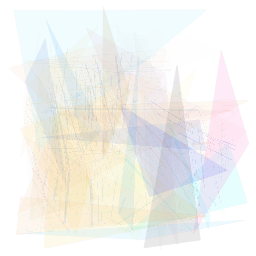

[2021-08-31 13:34:05.041791]   Iteration 630, lr 0.03, loss -0.2413330078125 loss (without noise) -0.2105712890625


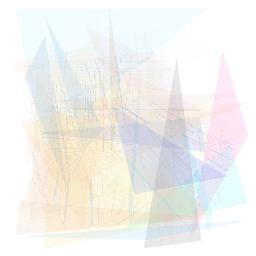

[2021-08-31 13:34:07.189663]   Iteration 640, lr 0.03, loss -0.248046875 loss (without noise) -0.2030029296875


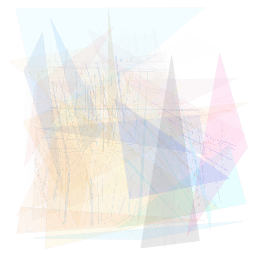

[2021-08-31 13:34:09.315634]   Iteration 650, lr 0.03, loss -0.275146484375 loss (without noise) -0.2149658203125


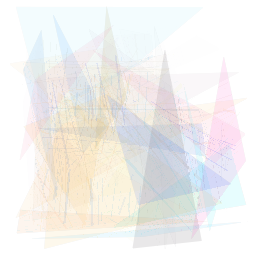

[2021-08-31 13:34:11.518606]   Iteration 660, lr 0.03, loss -0.2200927734375 loss (without noise) -0.2142333984375


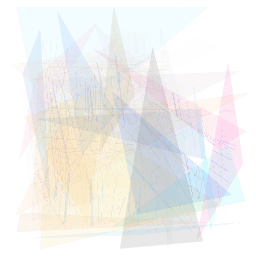

[2021-08-31 13:34:13.737230]   Iteration 670, lr 0.03, loss -0.2364501953125 loss (without noise) -0.204833984375


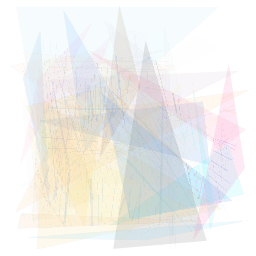

[2021-08-31 13:34:15.980703]   Iteration 680, lr 0.03, loss -0.244140625 loss (without noise) -0.2132568359375


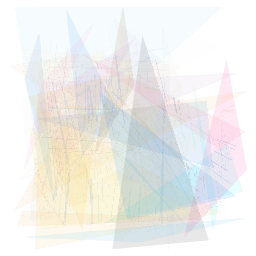

[2021-08-31 13:34:18.288901]   Iteration 690, lr 0.03, loss -0.232177734375 loss (without noise) -0.1925048828125


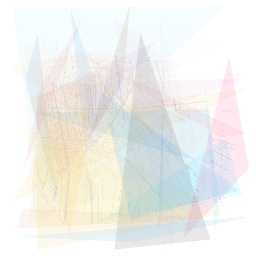

[2021-08-31 13:34:20.627181]   Iteration 700, lr 0.03, loss -0.2237548828125 loss (without noise) -0.2008056640625


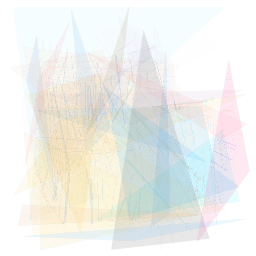

[2021-08-31 13:34:22.976278]   Iteration 710, lr 0.03, loss -0.2235107421875 loss (without noise) -0.195556640625


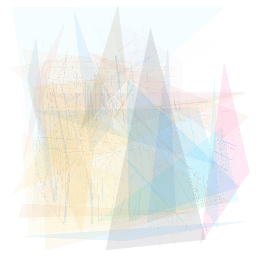

[2021-08-31 13:34:25.299492]   Iteration 720, lr 0.03, loss -0.252197265625 loss (without noise) -0.204345703125


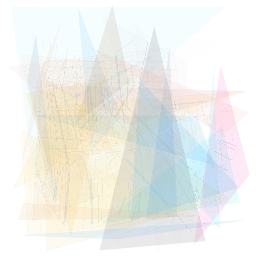

[2021-08-31 13:34:27.620276]   Iteration 730, lr 0.03, loss -0.22802734375 loss (without noise) -0.205322265625


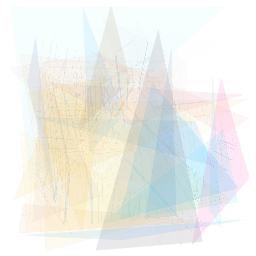

[2021-08-31 13:34:30.010693]   Iteration 740, lr 0.03, loss -0.243408203125 loss (without noise) -0.2054443359375


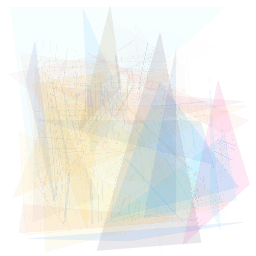

[2021-08-31 13:34:32.426548]   Iteration 750, lr 0.03, loss -0.250732421875 loss (without noise) -0.21337890625


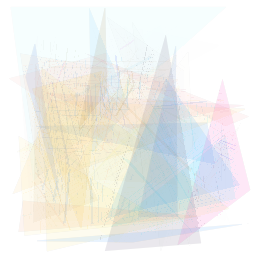

[2021-08-31 13:34:34.832222]   Iteration 760, lr 0.03, loss -0.22216796875 loss (without noise) -0.20068359375


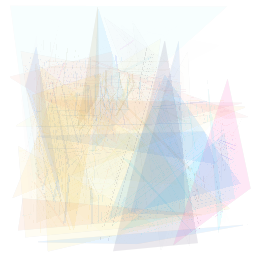

[2021-08-31 13:34:37.301086]   Iteration 770, lr 0.03, loss -0.281005859375 loss (without noise) -0.2236328125


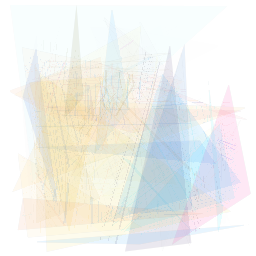

[2021-08-31 13:34:39.737236]   Iteration 780, lr 0.03, loss -0.26953125 loss (without noise) -0.218994140625


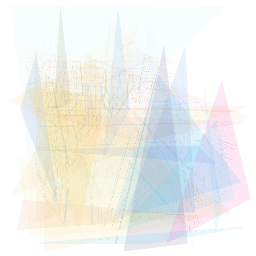

[2021-08-31 13:34:42.208843]   Iteration 790, lr 0.03, loss -0.258056640625 loss (without noise) -0.2261962890625


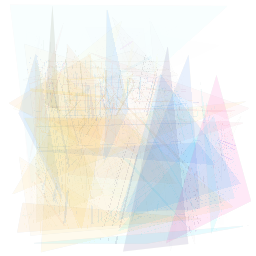

[2021-08-31 13:34:44.703129]   Iteration 800, lr 0.03, loss -0.2352294921875 loss (without noise) -0.2340087890625


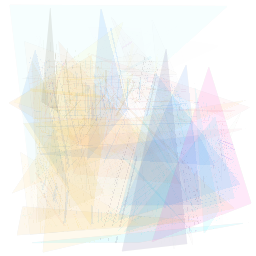

[2021-08-31 13:34:47.192879]   Iteration 810, lr 0.03, loss -0.2685546875 loss (without noise) -0.2213134765625


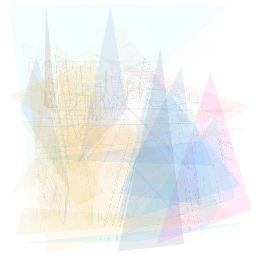

[2021-08-31 13:34:49.713019]   Iteration 820, lr 0.03, loss -0.273681640625 loss (without noise) -0.22119140625


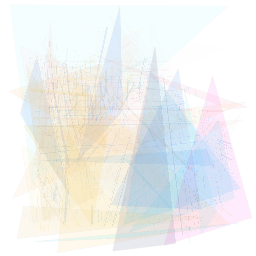

[2021-08-31 13:34:52.241280]   Iteration 830, lr 0.03, loss -0.254150390625 loss (without noise) -0.2310791015625


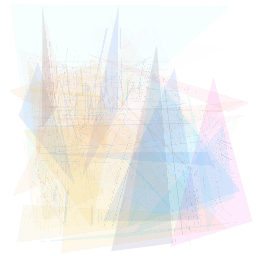

[2021-08-31 13:34:54.829762]   Iteration 840, lr 0.03, loss -0.28125 loss (without noise) -0.2137451171875


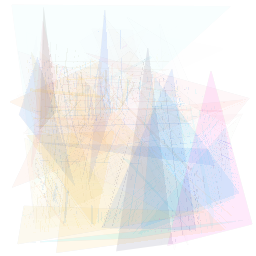

[2021-08-31 13:34:57.455826]   Iteration 850, lr 0.03, loss -0.275146484375 loss (without noise) -0.2303466796875


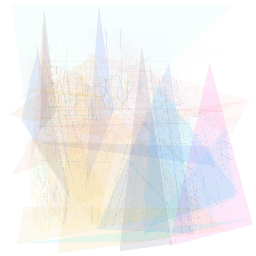

[2021-08-31 13:35:00.231025]   Iteration 860, lr 0.03, loss -0.25927734375 loss (without noise) -0.229248046875


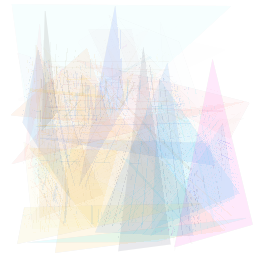

[2021-08-31 13:35:03.046144]   Iteration 870, lr 0.03, loss -0.286376953125 loss (without noise) -0.255859375


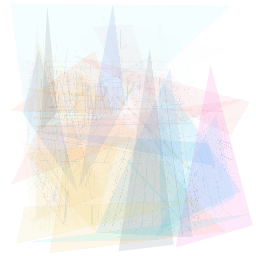

[2021-08-31 13:35:05.780691]   Iteration 880, lr 0.03, loss -0.255126953125 loss (without noise) -0.2205810546875


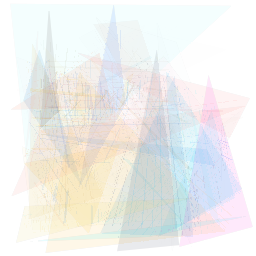

[2021-08-31 13:35:08.496270]   Iteration 890, lr 0.03, loss -0.2822265625 loss (without noise) -0.2265625


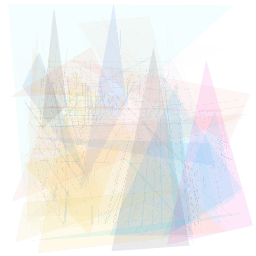

[2021-08-31 13:35:11.216062]   Iteration 900, lr 0.03, loss -0.271240234375 loss (without noise) -0.2078857421875


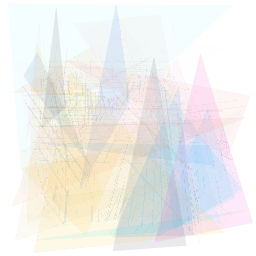

[2021-08-31 13:35:14.016784]   Iteration 910, lr 0.03, loss -0.2705078125 loss (without noise) -0.2152099609375


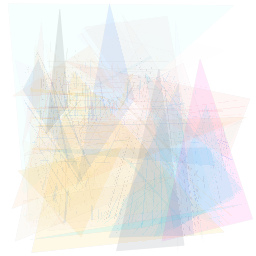

[2021-08-31 13:35:16.741148]   Iteration 920, lr 0.03, loss -0.2469482421875 loss (without noise) -0.216064453125


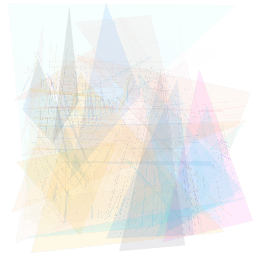

[2021-08-31 13:35:19.542196]   Iteration 930, lr 0.03, loss -0.259521484375 loss (without noise) -0.1923828125


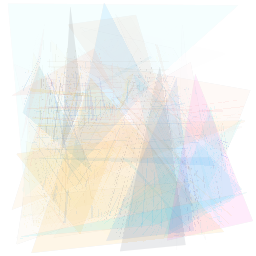

[2021-08-31 13:35:22.350013]   Iteration 940, lr 0.03, loss -0.244873046875 loss (without noise) -0.2012939453125


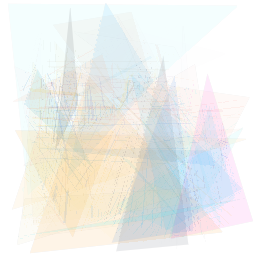

[2021-08-31 13:35:25.152897]   Iteration 950, lr 0.03, loss -0.254638671875 loss (without noise) -0.208984375


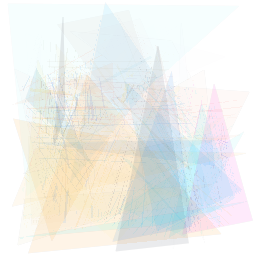

[2021-08-31 13:35:28.042482]   Iteration 960, lr 0.03, loss -0.250244140625 loss (without noise) -0.22412109375


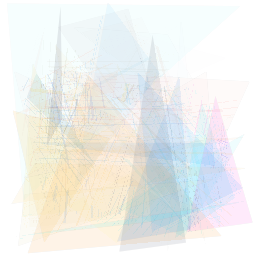

[2021-08-31 13:35:30.961924]   Iteration 970, lr 0.03, loss -0.2431640625 loss (without noise) -0.222900390625


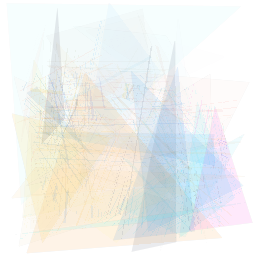

[2021-08-31 13:35:33.887139]   Iteration 980, lr 0.03, loss -0.2451171875 loss (without noise) -0.2149658203125


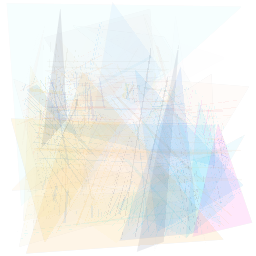

[2021-08-31 13:35:36.858988]   Iteration 990, lr 0.03, loss -0.260009765625 loss (without noise) -0.2176513671875


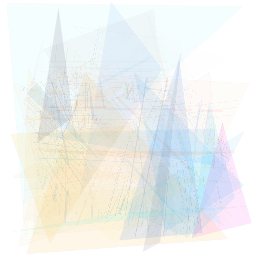

[2021-08-31 13:35:39.825802]   Iteration 1000, lr 0.03, loss -0.270751953125 loss (without noise) -0.199951171875


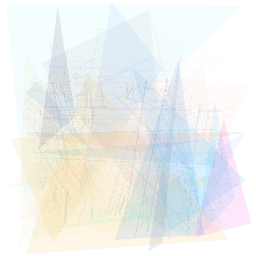

[2021-08-31 13:35:42.801466]   Iteration 1010, lr 0.03, loss -0.269287109375 loss (without noise) -0.2274169921875


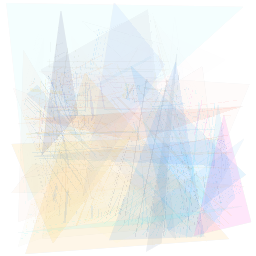

[2021-08-31 13:35:45.863402]   Iteration 1020, lr 0.03, loss -0.231689453125 loss (without noise) -0.222412109375


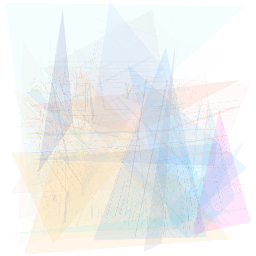

[2021-08-31 13:35:48.913966]   Iteration 1030, lr 0.03, loss -0.26318359375 loss (without noise) -0.217041015625


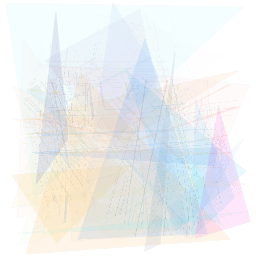

[2021-08-31 13:35:51.940076]   Iteration 1040, lr 0.03, loss -0.266845703125 loss (without noise) -0.2235107421875


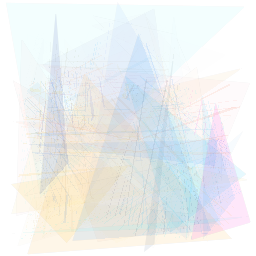

[2021-08-31 13:35:55.082719]   Iteration 1050, lr 0.03, loss -0.2529296875 loss (without noise) -0.2220458984375


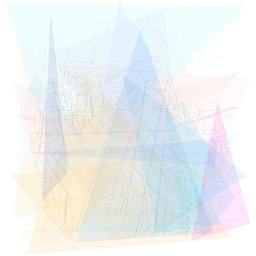

[2021-08-31 13:35:58.280673]   Iteration 1060, lr 0.03, loss -0.262451171875 loss (without noise) -0.2230224609375


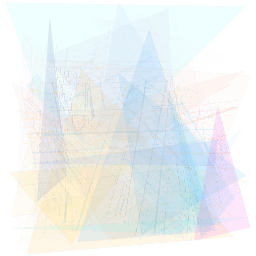

[2021-08-31 13:36:01.437270]   Iteration 1070, lr 0.03, loss -0.2626953125 loss (without noise) -0.21630859375


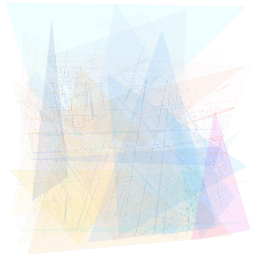

[2021-08-31 13:36:04.607824]   Iteration 1080, lr 0.03, loss -0.268310546875 loss (without noise) -0.2147216796875


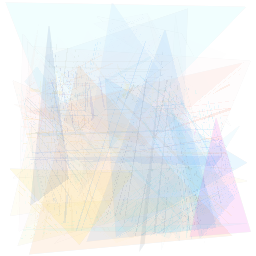

[2021-08-31 13:36:07.813071]   Iteration 1090, lr 0.03, loss -0.252685546875 loss (without noise) -0.2191162109375


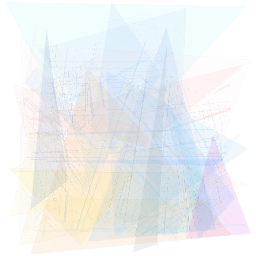

[2021-08-31 13:36:11.019592]   Iteration 1100, lr 0.03, loss -0.241455078125 loss (without noise) -0.212646484375


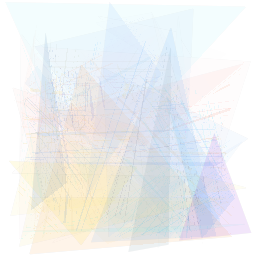

[2021-08-31 13:36:14.202223]   Iteration 1110, lr 0.03, loss -0.267578125 loss (without noise) -0.2059326171875


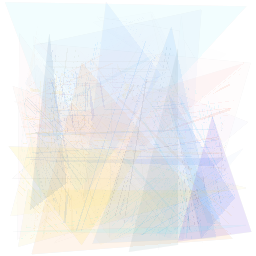

[2021-08-31 13:36:17.390188]   Iteration 1120, lr 0.03, loss -0.27001953125 loss (without noise) -0.212158203125


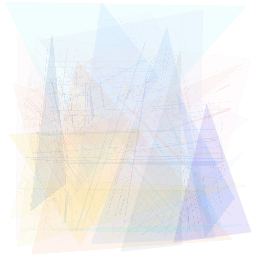

[2021-08-31 13:36:20.643259]   Iteration 1130, lr 0.03, loss -0.245361328125 loss (without noise) -0.2183837890625


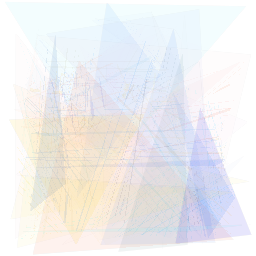

[2021-08-31 13:36:23.882632]   Iteration 1140, lr 0.03, loss -0.25634765625 loss (without noise) -0.2227783203125


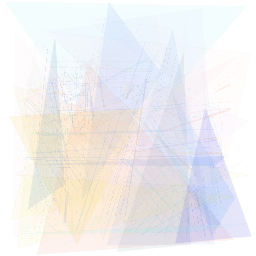

[2021-08-31 13:36:27.136893]   Iteration 1150, lr 0.03, loss -0.27587890625 loss (without noise) -0.2314453125


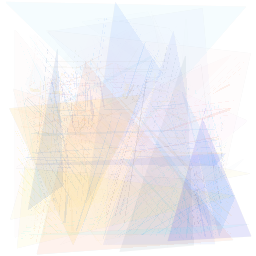

[2021-08-31 13:36:30.575935]   Iteration 1160, lr 0.03, loss -0.261474609375 loss (without noise) -0.197265625


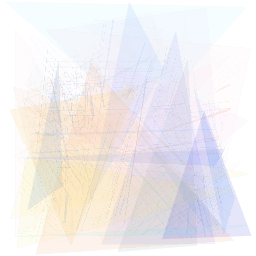

[2021-08-31 13:36:33.966895]   Iteration 1170, lr 0.03, loss -0.249755859375 loss (without noise) -0.2103271484375


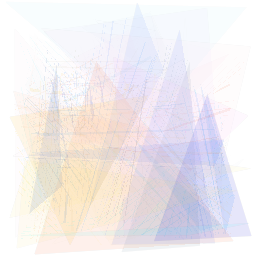

[2021-08-31 13:36:37.430043]   Iteration 1180, lr 0.03, loss -0.2486572265625 loss (without noise) -0.2064208984375


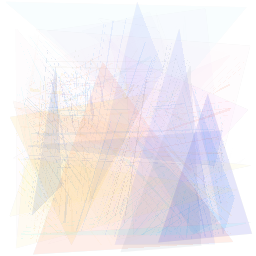

[2021-08-31 13:36:40.899823]   Iteration 1190, lr 0.03, loss -0.23779296875 loss (without noise) -0.2119140625


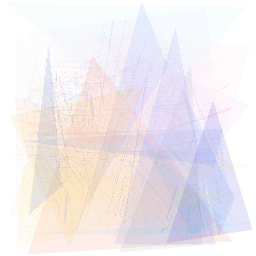

[2021-08-31 13:36:44.474970]   Iteration 1200, lr 0.03, loss -0.2410888671875 loss (without noise) -0.2274169921875


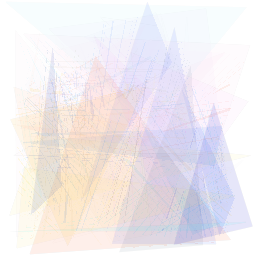

[2021-08-31 13:36:48.019463]   Iteration 1210, lr 0.03, loss -0.2283935546875 loss (without noise) -0.22607421875


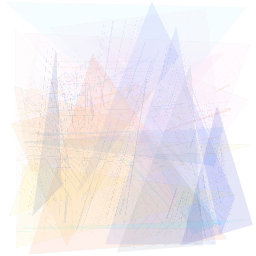

[2021-08-31 13:36:51.616995]   Iteration 1220, lr 0.03, loss -0.260986328125 loss (without noise) -0.2088623046875


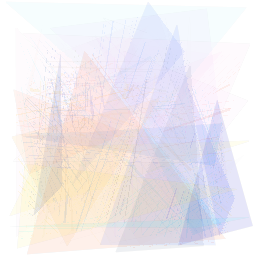

[2021-08-31 13:36:55.162746]   Iteration 1230, lr 0.03, loss -0.230224609375 loss (without noise) -0.2198486328125


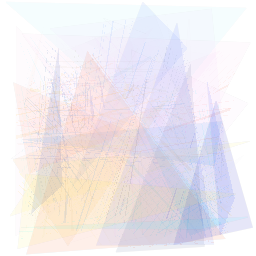

[2021-08-31 13:36:58.690143]   Iteration 1240, lr 0.03, loss -0.275146484375 loss (without noise) -0.2083740234375


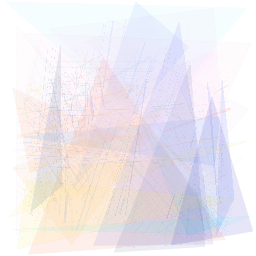

[2021-08-31 13:37:02.375953]   Iteration 1250, lr 0.03, loss -0.2369384765625 loss (without noise) -0.2103271484375


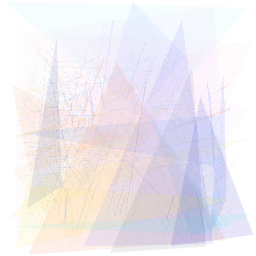

[2021-08-31 13:37:06.085322]   Iteration 1260, lr 0.03, loss -0.251953125 loss (without noise) -0.207275390625


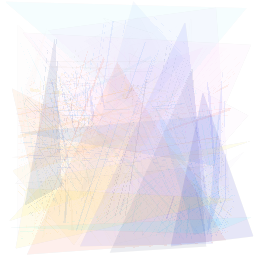

[2021-08-31 13:37:09.738983]   Iteration 1270, lr 0.03, loss -0.22900390625 loss (without noise) -0.211669921875


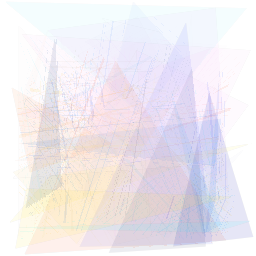

[2021-08-31 13:37:13.509656]   Iteration 1280, lr 0.03, loss -0.2445068359375 loss (without noise) -0.2169189453125


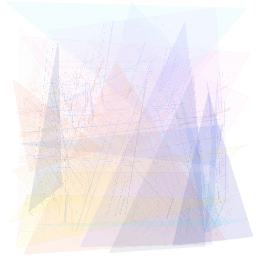

[2021-08-31 13:37:17.252669]   Iteration 1290, lr 0.03, loss -0.234130859375 loss (without noise) -0.2293701171875


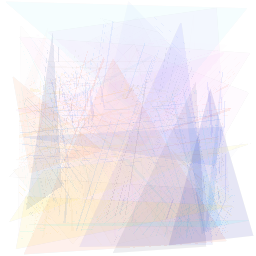

[2021-08-31 13:37:21.012287]   Iteration 1300, lr 0.03, loss -0.2369384765625 loss (without noise) -0.20703125


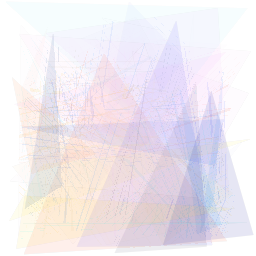

[2021-08-31 13:37:24.813347]   Iteration 1310, lr 0.03, loss -0.2440185546875 loss (without noise) -0.2095947265625


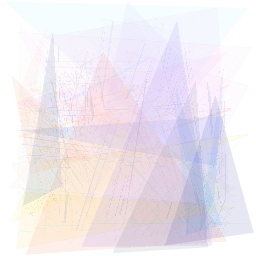

[2021-08-31 13:37:28.622416]   Iteration 1320, lr 0.03, loss -0.266357421875 loss (without noise) -0.2403564453125


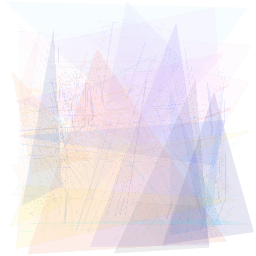

[2021-08-31 13:37:32.484135]   Iteration 1330, lr 0.03, loss -0.275146484375 loss (without noise) -0.2274169921875


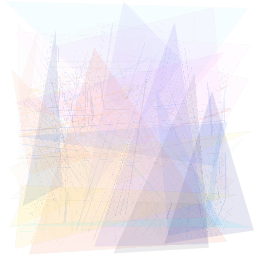

[2021-08-31 13:37:36.237045]   Iteration 1340, lr 0.03, loss -0.25341796875 loss (without noise) -0.2254638671875


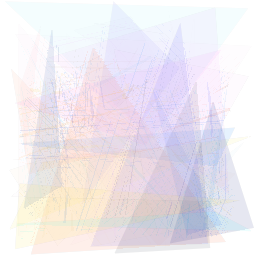

[2021-08-31 13:37:39.966199]   Iteration 1350, lr 0.03, loss -0.242919921875 loss (without noise) -0.21826171875


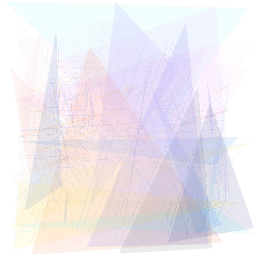

[2021-08-31 13:37:43.795689]   Iteration 1360, lr 0.03, loss -0.258056640625 loss (without noise) -0.1898193359375


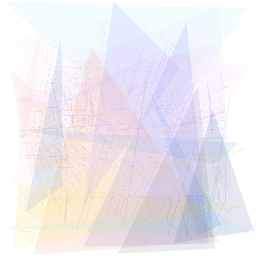

[2021-08-31 13:37:47.678482]   Iteration 1370, lr 0.03, loss -0.2666015625 loss (without noise) -0.2100830078125


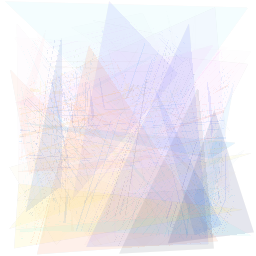

[2021-08-31 13:37:51.615529]   Iteration 1380, lr 0.03, loss -0.26416015625 loss (without noise) -0.224853515625


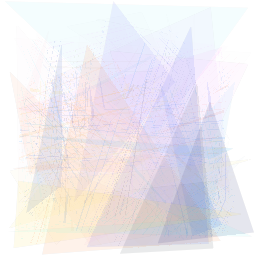

[2021-08-31 13:37:55.599439]   Iteration 1390, lr 0.03, loss -0.26123046875 loss (without noise) -0.2132568359375


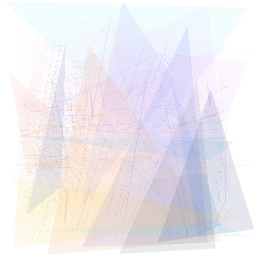

[2021-08-31 13:37:59.639934]   Iteration 1400, lr 0.03, loss -0.277587890625 loss (without noise) -0.2301025390625


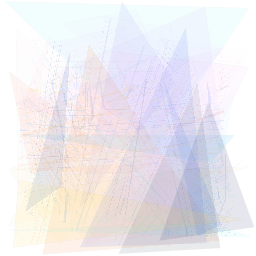

[2021-08-31 13:38:03.711828]   Iteration 1410, lr 0.03, loss -0.265625 loss (without noise) -0.221435546875


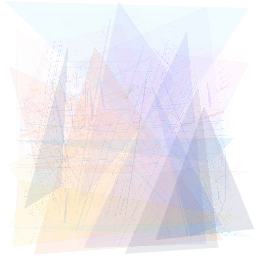

[2021-08-31 13:38:07.825677]   Iteration 1420, lr 0.03, loss -0.233642578125 loss (without noise) -0.2230224609375


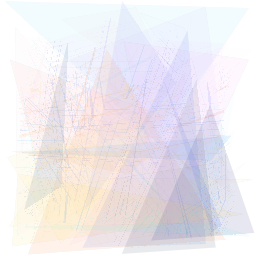

[2021-08-31 13:38:11.919934]   Iteration 1430, lr 0.03, loss -0.2369384765625 loss (without noise) -0.2127685546875


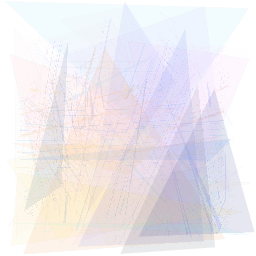

[2021-08-31 13:38:16.063599]   Iteration 1440, lr 0.03, loss -0.24267578125 loss (without noise) -0.2000732421875


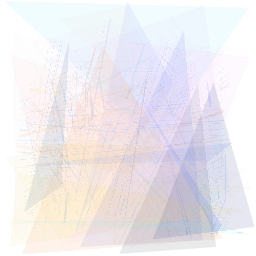

[2021-08-31 13:38:20.212820]   Iteration 1450, lr 0.03, loss -0.2626953125 loss (without noise) -0.212646484375


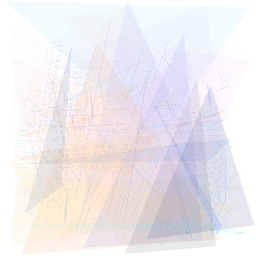

[2021-08-31 13:38:24.403110]   Iteration 1460, lr 0.03, loss -0.2381591796875 loss (without noise) -0.2186279296875


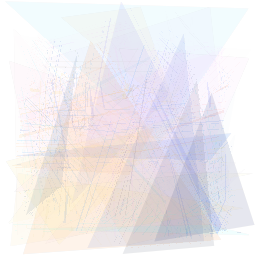

[2021-08-31 13:38:28.662335]   Iteration 1470, lr 0.03, loss -0.2315673828125 loss (without noise) -0.20361328125


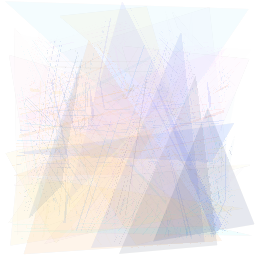

[2021-08-31 13:38:32.871830]   Iteration 1480, lr 0.03, loss -0.2200927734375 loss (without noise) -0.2054443359375


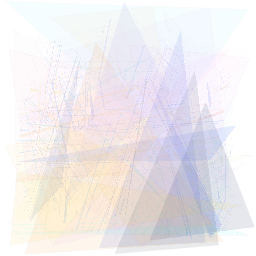

[2021-08-31 13:38:37.103404]   Iteration 1490, lr 0.03, loss -0.220947265625 loss (without noise) -0.2086181640625


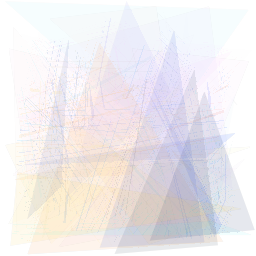

[2021-08-31 13:38:41.362226]   Iteration 1500, lr 0.03, loss -0.2491455078125 loss (without noise) -0.2034912109375


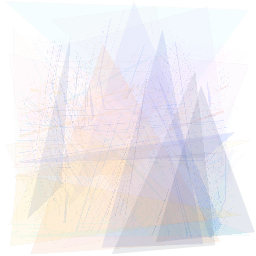

[2021-08-31 13:38:45.686837]   Iteration 1510, lr 0.029976023251634627, loss -0.227294921875 loss (without noise) -0.1966552734375


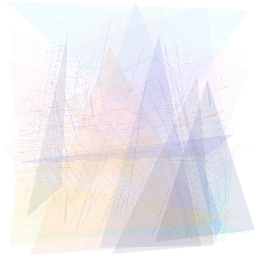

[2021-08-31 13:38:49.999355]   Iteration 1520, lr 0.0298932390685472, loss -0.254150390625 loss (without noise) -0.2193603515625


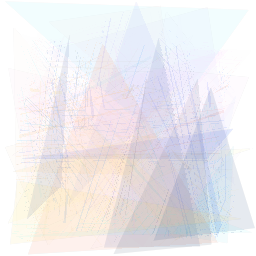

[2021-08-31 13:38:54.267551]   Iteration 1530, lr 0.029751678074929944, loss -0.2476806640625 loss (without noise) -0.224365234375


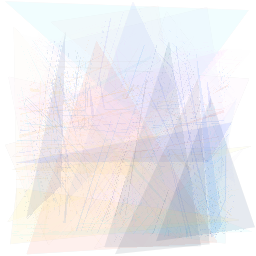

[2021-08-31 13:38:58.665560]   Iteration 1540, lr 0.029551898947351586, loss -0.235107421875 loss (without noise) -0.205810546875


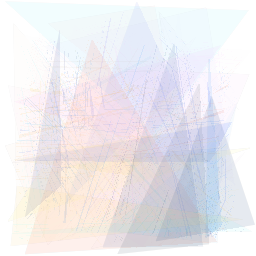

[2021-08-31 13:39:03.034292]   Iteration 1550, lr 0.029294690122758284, loss -0.24365234375 loss (without noise) -0.2130126953125


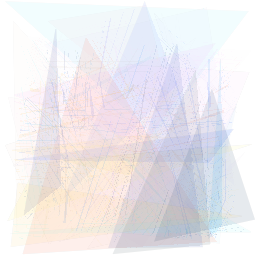

[2021-08-31 13:39:07.458739]   Iteration 1560, lr 0.028981066686873166, loss -0.250732421875 loss (without noise) -0.2275390625


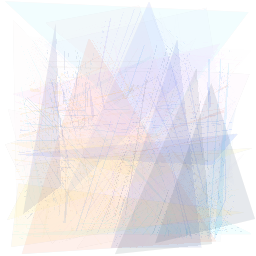

[2021-08-31 13:39:11.978738]   Iteration 1570, lr 0.028612266368116757, loss -0.242431640625 loss (without noise) -0.210693359375


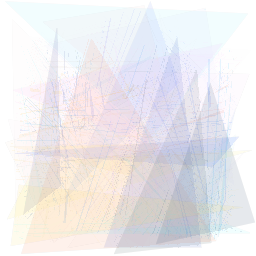

[2021-08-31 13:39:16.618888]   Iteration 1580, lr 0.028189744652858343, loss -0.2257080078125 loss (without noise) -0.221435546875


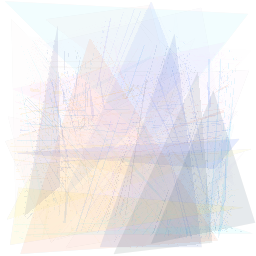

[2021-08-31 13:39:21.061828]   Iteration 1590, lr 0.027715169041276248, loss -0.2464599609375 loss (without noise) -0.2252197265625


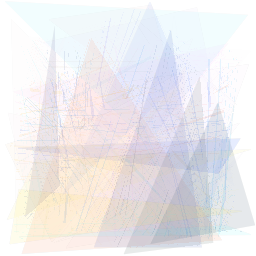

[2021-08-31 13:39:25.521074]   Iteration 1600, lr 0.027190412466496408, loss -0.232421875 loss (without noise) -0.2105712890625


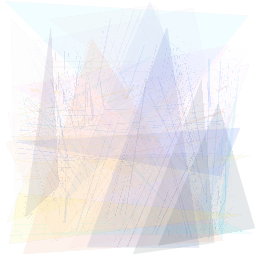

[2021-08-31 13:39:30.074850]   Iteration 1610, lr 0.026617545902981005, loss -0.2314453125 loss (without noise) -0.209716796875


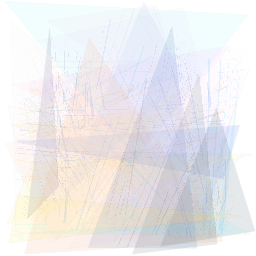

[2021-08-31 13:39:34.617849]   Iteration 1620, lr 0.025998830193338394, loss -0.2430419921875 loss (without noise) -0.2015380859375


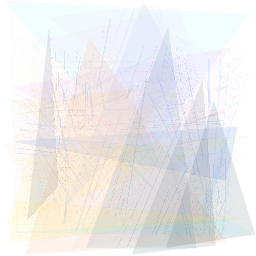

[2021-08-31 13:39:39.123913]   Iteration 1630, lr 0.025336707125810223, loss -0.263916015625 loss (without noise) -0.21240234375


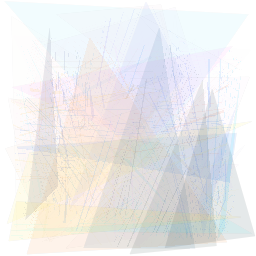

[2021-08-31 13:39:43.696557]   Iteration 1640, lr 0.024633789797648766, loss -0.25341796875 loss (without noise) -0.2177734375


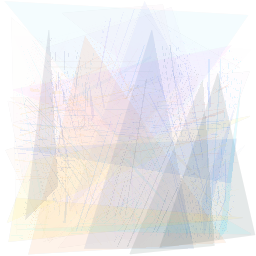

[2021-08-31 13:39:48.290893]   Iteration 1650, lr 0.02389285230241589, loss -0.2373046875 loss (without noise) -0.1990966796875


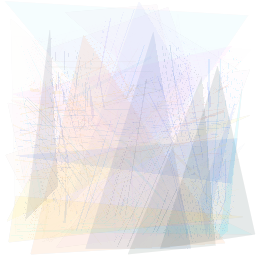

[2021-08-31 13:39:52.949417]   Iteration 1660, lr 0.023116818781903137, loss -0.2327880859375 loss (without noise) -0.22021484375


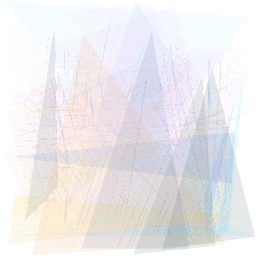

[2021-08-31 13:39:57.550313]   Iteration 1670, lr 0.022308751885879982, loss -0.2391357421875 loss (without noise) -0.220458984375


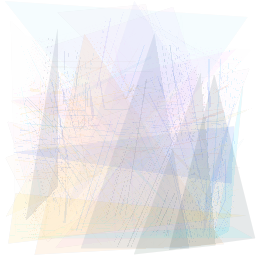

[2021-08-31 13:40:02.316816]   Iteration 1680, lr 0.021471840685214377, loss -0.241943359375 loss (without noise) -0.19970703125


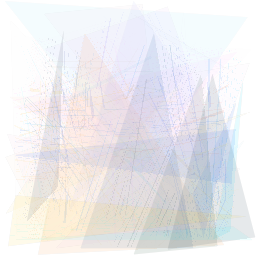

[2021-08-31 13:40:07.155287]   Iteration 1690, lr 0.020609388086067, loss -0.233642578125 loss (without noise) -0.1959228515625


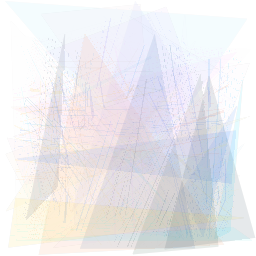

[2021-08-31 13:40:11.905442]   Iteration 1700, lr 0.019724797794829566, loss -0.2486572265625 loss (without noise) -0.19873046875


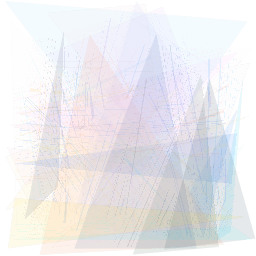

[2021-08-31 13:40:16.640470]   Iteration 1710, lr 0.01882156088525072, loss -0.243896484375 loss (without noise) -0.19091796875


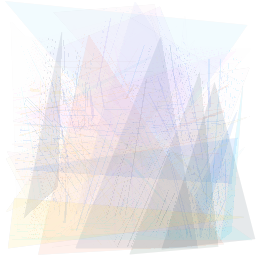

[2021-08-31 13:40:21.415777]   Iteration 1720, lr 0.017903242020762895, loss -0.287109375 loss (without noise) -0.207763671875


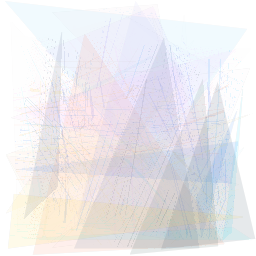

[2021-08-31 13:40:26.197459]   Iteration 1730, lr 0.016973465386384223, loss -0.2353515625 loss (without noise) -0.2025146484375


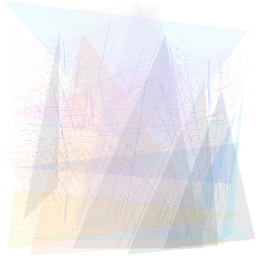

[2021-08-31 13:40:31.033068]   Iteration 1740, lr 0.016035900385716072, loss -0.2342529296875 loss (without noise) -0.20361328125


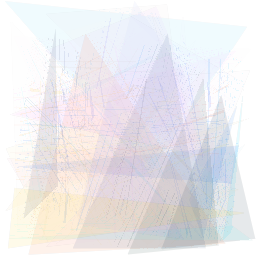

[2021-08-31 13:40:35.886117]   Iteration 1750, lr 0.015094247159483373, loss -0.253662109375 loss (without noise) -0.2061767578125


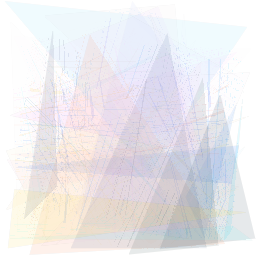

[2021-08-31 13:40:40.729462]   Iteration 1760, lr 0.014152221982769641, loss -0.27392578125 loss (without noise) -0.2159423828125


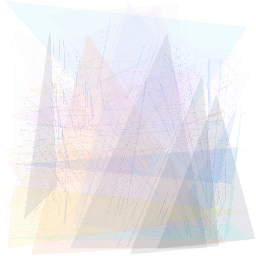

[2021-08-31 13:40:45.664907]   Iteration 1770, lr 0.01321354259857696, loss -0.2274169921875 loss (without noise) -0.1982421875


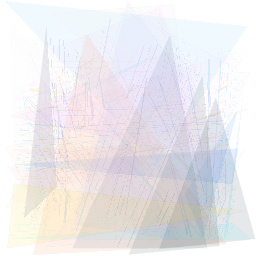

[2021-08-31 13:40:50.635047]   Iteration 1780, lr 0.012281913545592946, loss -0.274169921875 loss (without noise) -0.2021484375


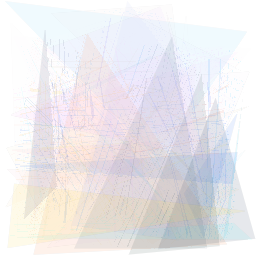

[2021-08-31 13:40:55.638362]   Iteration 1790, lr 0.011361011538068896, loss -0.244140625 loss (without noise) -0.187744140625


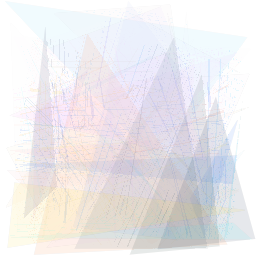

[2021-08-31 13:41:00.654758]   Iteration 1800, lr 0.010454470955508395, loss -0.23876953125 loss (without noise) -0.2008056640625


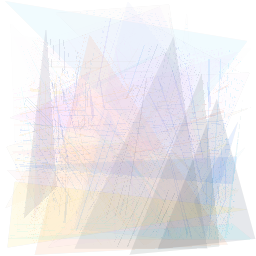

[2021-08-31 13:41:05.779775]   Iteration 1810, lr 0.00956586949943182, loss -0.26025390625 loss (without noise) -0.2481689453125


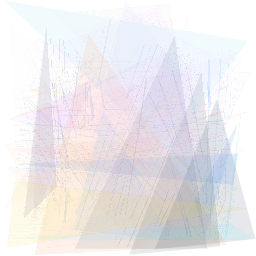

[2021-08-31 13:41:10.930064]   Iteration 1820, lr 0.00869871407382291, loss -0.2376708984375 loss (without noise) -0.2205810546875


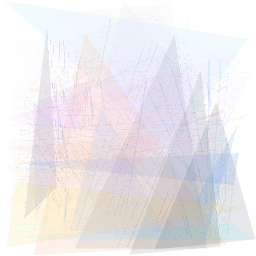

[2021-08-31 13:41:16.099410]   Iteration 1830, lr 0.007856426944980916, loss -0.25048828125 loss (without noise) -0.2158203125


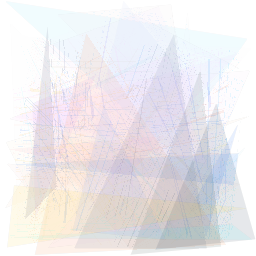

[2021-08-31 13:41:21.272277]   Iteration 1840, lr 0.00704233223539899, loss -0.28369140625 loss (without noise) -0.2264404296875


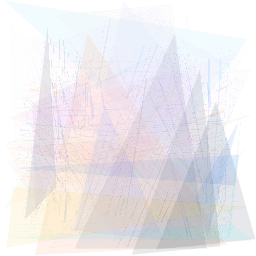

[2021-08-31 13:41:26.436879]   Iteration 1850, lr 0.00625964280497136, loss -0.24365234375 loss (without noise) -0.2117919921875


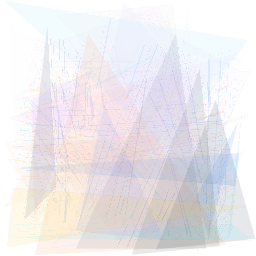

[2021-08-31 13:41:31.805796]   Iteration 1860, lr 0.005511447571303133, loss -0.260009765625 loss (without noise) -0.20849609375


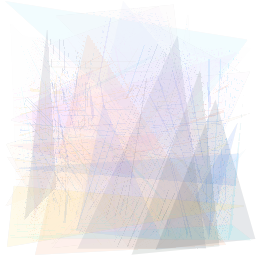

[2021-08-31 13:41:36.960372]   Iteration 1870, lr 0.004800699319163711, loss -0.252685546875 loss (without noise) -0.2061767578125


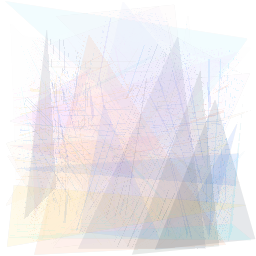

[2021-08-31 13:41:42.120594]   Iteration 1880, lr 0.0041302030471942995, loss -0.2412109375 loss (without noise) -0.2061767578125


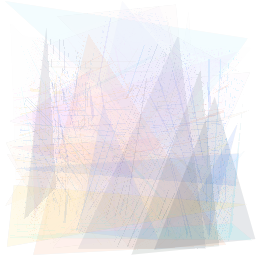

[2021-08-31 13:41:47.336942]   Iteration 1890, lr 0.0035026048978597504, loss -0.279052734375 loss (without noise) -0.203857421875


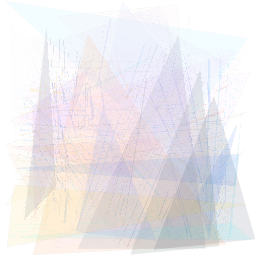

[2021-08-31 13:41:52.679554]   Iteration 1900, lr 0.0029203817143331682, loss -0.249755859375 loss (without noise) -0.208740234375


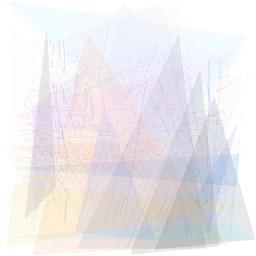

[2021-08-31 13:41:57.954639]   Iteration 1910, lr 0.0023858312655274626, loss -0.2734375 loss (without noise) -0.228759765625


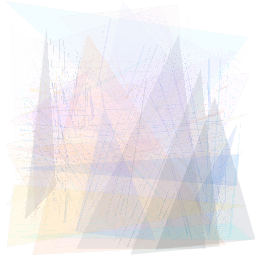

[2021-08-31 13:42:03.380314]   Iteration 1920, lr 0.001901063177851196, loss -0.269287109375 loss (without noise) -0.2288818359375


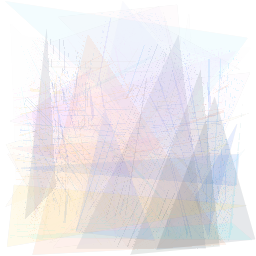

[2021-08-31 13:42:08.844952]   Iteration 1930, lr 0.0014679906094769556, loss -0.27587890625 loss (without noise) -0.20654296875


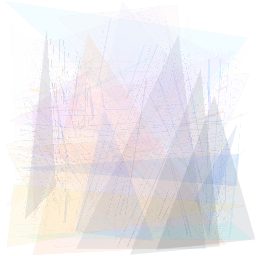

[2021-08-31 13:42:14.278566]   Iteration 1940, lr 0.0010883226999800777, loss -0.28466796875 loss (without noise) -0.2056884765625


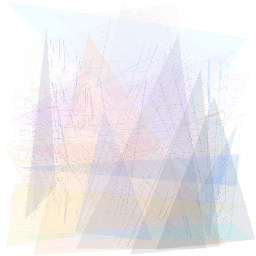

[2021-08-31 13:42:19.617801]   Iteration 1950, lr 0.0007635578251455794, loss -0.2607421875 loss (without noise) -0.2158203125


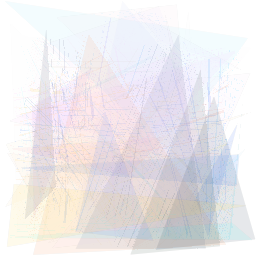

[2021-08-31 13:42:25.022884]   Iteration 1960, lr 0.0004949776835634717, loss -0.259765625 loss (without noise) -0.2279052734375


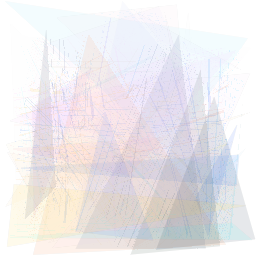

[2021-08-31 13:42:30.517839]   Iteration 1970, lr 0.000283642238349987, loss -0.257568359375 loss (without noise) -0.2303466796875


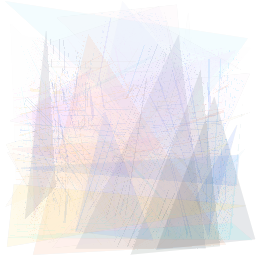

[2021-08-31 13:42:36.103062]   Iteration 1980, lr 0.00013038553395740114, loss -0.27978515625 loss (without noise) -0.2261962890625


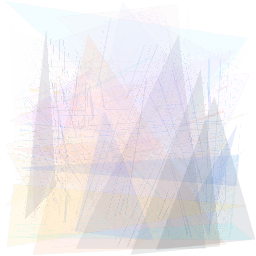

[2021-08-31 13:42:41.658898]   Iteration 1990, lr 3.5812404581621604e-05, loss -0.2822265625 loss (without noise) -0.207763671875


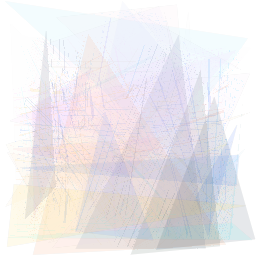

[2021-08-31 13:42:47.299434]   Iteration 2000, lr 2.9608715794327e-07, loss -0.2484130859375 loss (without noise) -0.2408447265625


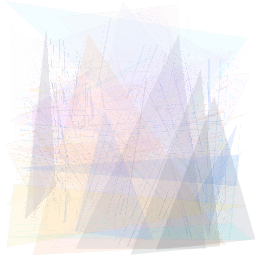

In [22]:
def get_loss(out):
    img = out.permute(0, 3, 1, 2)
    t = img
    NUM_AUGS = 10
    t = t.repeat_interleave(NUM_AUGS, dim=0)
    img_augs = trans(t)
    image_features = model.encode_image(img_augs)
    similiarities = torch.cosine_similarity(image_features, text_features, axis=-1)
    loss = -similiarities.mean()
    return loss

pil_img_list = []
info_list = []

for i in range(n_iterations):
    lr = ors.get_lr_scale(i) * base_lr
    optim.param_groups[0]['lr'] = lr
    noise_factor = 0.05
    noise_scale = (noise_factor * ors.get_noise_scale(i))
    verts_noise = torch.randn_like(verts) * noise_scale
    color_noise = torch.randn_like(color) * noise_scale * 0.5
    verts_in = verts + verts_noise
    color_in = color + color_noise
    out = render(verts, color_in, {'bg_noise': 0.05})
    loss = get_loss(out)
    
    optim.zero_grad()
    loss.backward()
    
    if (i + 1) % report_iterations == 0:
        
        with torch.no_grad():
            verts_in = verts
            color_in = color
            out = render(verts, color_in, {'bg_noise': 0.0})
            wonoise_loss = get_loss(out)

        info = f"[{datetime.now()}]   Iteration {i + 1}, lr {optim.param_groups[0]['lr']}, loss {loss.item()} loss (without noise) {wonoise_loss.item()}"
        print(info)
        info_list.append(info)
        save_info_list(f'{save_dir}/log.txt', info_list)
            
        show(out)
        pil_img_list.append(to_pil_img(out))
        save_as_gif(f'{save_dir}/animate.gif', pil_img_list, fps=12)
        save_as_frames(f'{save_dir}/animate.frames', pil_img_list)
        
    optim.step()